In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from catboost import CatBoostClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics 
from sklearn.model_selection import GridSearchCV
sns.set()

In [2]:
# Import Data
df = pd.read_csv("./data/superstore_data.csv")
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])


In [3]:
print(df.dtypes)

Id                              int64
Year_Birth                      int64
Education                      object
Marital_Status                 object
Income                        float64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts                 int64
MntSweetProducts                int64
MntGoldProds                    int64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
Response                        int64
Complain                        int64
dtype: object


### Categorical Variables

Column Education has 0 missing values and the value counts are as follows :


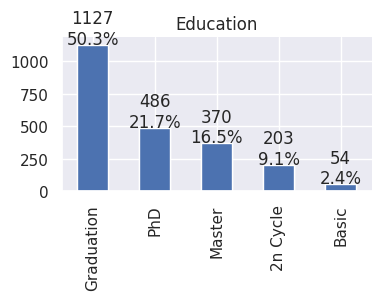

Column Marital_Status has 0 missing values and the value counts are as follows :


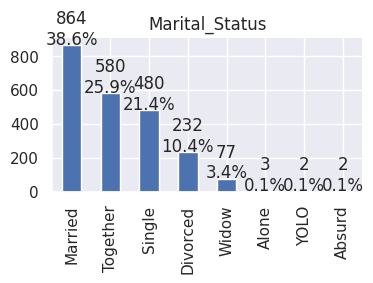

In [4]:
categorical_cols = df.select_dtypes(include=['object'])

for col in categorical_cols:
    na_count = df[col].isna().sum()
    value_count = df[col].value_counts(dropna=False)
    
    print(f"Column {col} has {na_count} missing values and the value counts are as follows :")
    plt.figure(figsize=(4, 2))
    value_count.plot(kind='bar')
    ax = value_count.plot(kind='bar')
    ax.set_title(col)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for i, v in enumerate(value_count):
        ax.text(i, v+5, f"{v}\n{round(v/len(df)*100, 1)}%", ha='center')
    plt.show()

In [5]:
numerical_cols = df.select_dtypes(include=['int64', 'float64'])
for col in numerical_cols:
    na_count = df[col].isna().sum()
    value_count = df[col].value_counts(dropna=False)
    if na_count > 0:
        print(f"Column {col} has {na_count} missing values")
        

Column Income has 24 missing values


In [6]:
numerical_cols.describe()

,Id,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.149107,0.009375
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.356274,0.096391
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000


In [7]:
numerical_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Income               2216 non-null   float64
 3   Kidhome              2240 non-null   int64  
 4   Teenhome             2240 non-null   int64  
 5   Recency              2240 non-null   int64  
 6   MntWines             2240 non-null   int64  
 7   MntFruits            2240 non-null   int64  
 8   MntMeatProducts      2240 non-null   int64  
 9   MntFishProducts      2240 non-null   int64  
 10  MntSweetProducts     2240 non-null   int64  
 11  MntGoldProds         2240 non-null   int64  
 12  NumDealsPurchases    2240 non-null   int64  
 13  NumWebPurchases      2240 non-null   int64  
 14  NumCatalogPurchases  2240 non-null   int64  
 15  NumStorePurchases    2240 non-null   i

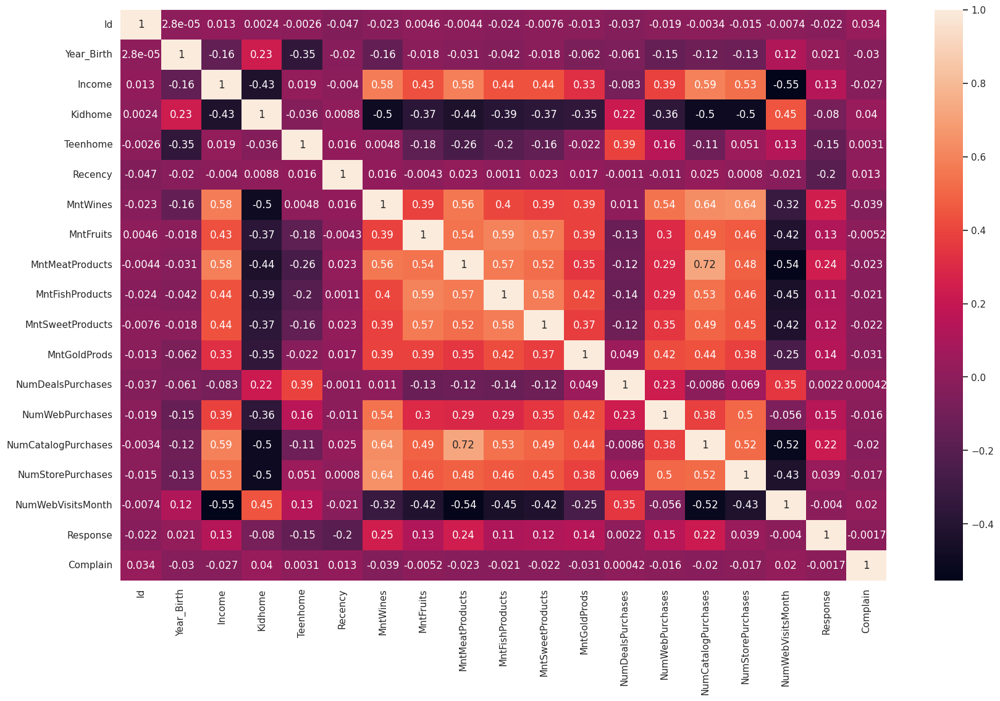

In [8]:
plt.figure(figsize=(20,12))
sns.heatmap(numerical_cols.corr() , annot = True)
plt.show()

In [9]:
corr_matrix = numerical_cols.corr()
high_corr = corr_matrix.where(np.triu(corr_matrix >= 0.6, k=1)).stack().reset_index()
high_corr

,level_0,level_1,0
0,MntWines,NumCatalogPurchases,0.635226
1,MntWines,NumStorePurchases,0.642100
2,MntMeatProducts,NumCatalogPurchases,0.723827


## Cleaning Data

In [10]:
df['Education'] = LabelEncoder().fit_transform(df['Education'])
df['Marital_Status'] = LabelEncoder().fit_transform(df['Marital_Status'])
df['Dt_Customer'] = (df['Dt_Customer'].min() - df['Dt_Customer'])/pd.Timedelta(1, unit='d')
df['Dt_Customer'] = df['Dt_Customer'].astype(float)
df['Income'] = df['Income'].fillna(df['Income'].median())
df['Year_Birth'] = 2023 - df['Year_Birth']

## Spliting the data into train and test

In [11]:
X = df.drop(['Response', 'Id'], axis=1)
y = df['Response']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y)

In [12]:
def model_train(models, X_train, X_test, y_train, y_test):
    results = []
    for model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        report = metrics.classification_report(y_test, y_pred, output_dict=True)
        result = {"Model": type(model).__name__,
                  "Precision": round(report['weighted avg']['precision'], 2),
                  "Recall": round(report['weighted avg']['recall'], 2),
                  "F1-score": round(report['weighted avg']['f1-score'], 2)}
        results.append(result)
    results_df = pd.DataFrame(results).sort_values(by=['F1-score'], ascending=False)
    return results_df

In [13]:
models = [LogisticRegression(),
          DecisionTreeClassifier(),
          RandomForestClassifier(),
          CatBoostClassifier(),
          XGBClassifier()]
results_df = model_train(models, X_train, X_test, y_train, y_test)


/home/jim/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Learning rate set to 0.012857
0:	learn: 0.6831233	total: 50.3ms	remaining: 50.3s
1:	learn: 0.6732232	total: 52.2ms	remaining: 26.1s
2:	learn: 0.6635040	total: 53.4ms	remaining: 17.8s
3:	learn: 0.6523976	total: 54.5ms	remaining: 13.6s
4:	learn: 0.6433969	total: 55.6ms	remaining: 11.1s
5:	learn: 0.6342483	total: 56.5ms	remaining: 9.37s
6:	learn: 0.6251025	total: 57.4ms	remaining: 8.14s
7:	learn: 0.6160756	total: 58.2ms	remaining: 7.22s
8:	learn: 0.6076568	total: 59.2ms	remaining: 6.51s
9:	learn: 0.6001771	total: 60ms	remaining: 5.94s
10:	learn: 0.5920332	total: 60.8ms	remaining: 5.46s
11:	learn: 0.5849193	total: 61.5ms	remaining: 5.07s
12:	learn: 0.5786275	total: 62.4ms	remaining: 4.74s
13:	learn: 0.5725675	total: 63.2ms	remaining: 4.45s
14:	learn: 0.5660535	total: 64ms	remaining: 4.2s
15:	learn: 0.5584805	total: 64.8ms	remaining: 3.99s
16:	learn: 0.5518887	total: 65.6ms	remaining: 3.79s
17:	learn: 0.5450434	total: 66.4ms	remaining: 3.62s
18:	learn: 0.5384706	total: 68ms	remaining: 3.51s

In [14]:
results_df

,Model,Precision,Recall,F1-score
3,CatBoostClassifier,0.84,0.87,0.85
2,RandomForestClassifier,0.85,0.87,0.84
4,XGBClassifier,0.83,0.84,0.84
0,LogisticRegression,0.81,0.85,0.82
1,DecisionTreeClassifier,0.82,0.81,0.82


## Hyper-tune the best model

In [15]:
param_grid = {
    'depth': [4, 8, 10, 25],
    'learning_rate': [0.03, 0.1, 0.12],
    'iterations': [2000,500, 1000],
}


In [16]:
%%time
grid_search = GridSearchCV(estimator=CatBoostClassifier(), param_grid=param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)
grid_search.fit(X_train, y_train)

0:	learn: 0.6719211	total: 48.3ms	remaining: 1m 36s
1:	learn: 0.6505305	total: 49.3ms	remaining: 49.2s
2:	learn: 0.6308222	total: 50.2ms	remaining: 33.4s
3:	learn: 0.6104210	total: 51.1ms	remaining: 25.5s
4:	learn: 0.5954048	total: 52ms	remaining: 20.7s
5:	learn: 0.5787255	total: 56.9ms	remaining: 18.9s
6:	learn: 0.5648692	total: 79.8ms	remaining: 22.7s
7:	learn: 0.5519604	total: 83.6ms	remaining: 20.8s
8:	learn: 0.5400214	total: 84.7ms	remaining: 18.7s
9:	learn: 0.5280742	total: 85.4ms	remaining: 17s
10:	learn: 0.5185392	total: 86.6ms	remaining: 15.7s
11:	learn: 0.5080722	total: 90.7ms	remaining: 15s
12:	learn: 0.4975860	total: 91.3ms	remaining: 14s
13:	learn: 0.4873416	total: 91.9ms	remaining: 13s
14:	learn: 0.4777718	total: 92.5ms	remaining: 12.2s
15:	learn: 0.4704657	total: 93ms	remaining: 11.5s
16:	learn: 0.4624932	total: 94.1ms	remaining: 11s
17:	learn: 0.4541279	total: 94.7ms	remaining: 10.4s
18:	learn: 0.4482841	total: 95.3ms	remaining: 9.93s
19:	learn: 0.4415998	total: 95.8ms	

/home/jim/.local/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
45 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/home/jim/.local/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/jim/.local/lib/python3.10/site-packages/catboost/core.py", line 5131, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/home/jim/.local/lib/python3.10/site-packages/catboost/core.py",

0:	learn: 0.6139957	total: 1.27ms	remaining: 633ms
1:	learn: 0.5493188	total: 2.5ms	remaining: 623ms
2:	learn: 0.4959906	total: 3.48ms	remaining: 576ms
3:	learn: 0.4528648	total: 4.45ms	remaining: 552ms
4:	learn: 0.4249694	total: 5.45ms	remaining: 539ms
5:	learn: 0.4044826	total: 6.46ms	remaining: 531ms
6:	learn: 0.3858009	total: 7.49ms	remaining: 527ms
7:	learn: 0.3731156	total: 8.49ms	remaining: 522ms
8:	learn: 0.3637829	total: 9.87ms	remaining: 539ms
9:	learn: 0.3565997	total: 11ms	remaining: 538ms
10:	learn: 0.3478465	total: 12.1ms	remaining: 536ms
11:	learn: 0.3390762	total: 13.1ms	remaining: 533ms
12:	learn: 0.3335313	total: 14.1ms	remaining: 530ms
13:	learn: 0.3253194	total: 15.2ms	remaining: 526ms
14:	learn: 0.3197469	total: 16.2ms	remaining: 523ms
15:	learn: 0.3168397	total: 17.2ms	remaining: 521ms
16:	learn: 0.3116626	total: 18.3ms	remaining: 520ms
17:	learn: 0.3080047	total: 19.5ms	remaining: 521ms
18:	learn: 0.3027134	total: 20.6ms	remaining: 521ms
19:	learn: 0.2994534	tota

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f4e0d606470>,
             n_jobs=-1,
             param_grid={'depth': [4, 8, 10, 25],
                         'iterations': [2000, 500, 1000],
                         'learning_rate': [0.03, 0.1, 0.12]},
             scoring='f1_weighted')

In [17]:
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

Best parameters: {'depth': 4, 'iterations': 500, 'learning_rate': 0.12}
Best score: 0.859793514563662


In [23]:
best_model = CatBoostClassifier(depth = 4, iterations = 500, learning_rate = 0.12, verbose = 0)
best_model.fit(X,y)
y_pred = best_model.predict(X_test)
report = metrics.classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       477
           1       0.97      0.94      0.96        83

    accuracy                           0.99       560
   macro avg       0.98      0.97      0.97       560
weighted avg       0.99      0.99      0.99       560

